# In this notebook we will test the newest version of TESSPoint against the benchmark files created by a previous version of TESSPoint

In [110]:
%load_ext autoreload
%autoreload 2

from tesspoint import TESSPoint, footprint

import numpy as np
import pandas as pd
import subprocess
from multiprocessing.pool import Pool
from itertools import product

import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
dir_testfiles='/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/testfiles'
dir_testout='testout/'

In [102]:

dir_testfiles='/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/testfiles'
dir_testout='testout/'

fprfile="/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/footprint_input.dat"
pixfile=dir_testfiles+"/TEST_radec2pix_Sec{:02d}_Cam{}_CCD{}_stars2px.dat".format(Sector,Camera,CCD)
wcsfile=dir_testfiles+"/TEST_pix2radec_Sec{:02d}_Cam{}_CCD{}_stars2px.dat".format(Sector,Camera,CCD)


In [117]:
Camera_list=[1,2,3,4]
CCD_list=[1,2,3,4]
Sector_list = range(1,69)
inlist=list(product(Sector_list,Camera_list,CCD_list))

In [118]:
def test_pix2radec_SectorCameraCCD(SectorCameraCCD):
    Sector, Camera, CCD = SectorCameraCCD
    
    fprfile="/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/footprint_input.dat"
    footprint_df=pd.read_csv(fprfile,delimiter=' ',names=['tic','x','y'],index_col=False)

    pointing=TESSPoint(Sector,Camera,CCD)
    
    farr=np.array([footprint_df.x.to_numpy(),footprint_df.y.to_numpy()]).T
    footprint_radec=pointing.pix2radec(farr)
    
    test_df = pd.DataFrame({'tic':footprint_df.tic.to_numpy(),
                            'ra':footprint_radec[0],
                            'dec':footprint_radec[1]})
    test_df['index']=test_df['tic']
    return test_df


def test_pix2radec_benchmark_SectorCameraCCD(SectorCameraCCD):
    Sector, Camera, CCD = SectorCameraCCD
    
    dir_testfiles='/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/testfiles'
    wcsfile=dir_testfiles+"/TEST_pix2radec_Sec{:02d}_Cam{}_CCD{}_stars2px.dat".format(Sector,Camera,CCD)

    test_df = test_pix2radec_SectorCameraCCD(SectorCameraCCD)
    benchmark_df = pd.read_csv(wcsfile,delimiter=' ',names=['tic','ra','dec'],skiprows=1,index_col=False)

    idx = test_df.index.intersection(benchmark_df.index)
    dra = test_df.loc[idx, 'ra']  - benchmark_df.loc[idx, 'ra']
    ddec= test_df.loc[idx, 'dec'] - benchmark_df.loc[idx, 'dec']
    
    return idx, dra, ddec, Sector, Camera, CCD


In [121]:
from testfun import test_pix2radec_SectorCameraCCD, test_pix2radec_benchmark_SectorCameraCCD

test_pix2radec_df=pd.DataFrame(data=None, columns=['dra_med','dra_max','dra_std',
                                                   'ddec_med','ddec_max','ddec_std',
                                                   'Sector','Camera','CCD'])
pool=Pool()
for result in pool.map(test_pix2radec_benchmark_SectorCameraCCD, inlist):
    ra_med=np.median(result[1])
    ra_max=max(result[1])
    ra_std=np.std(result[1])
    
    dec_med=np.median(result[2])
    dec_max=max(result[2])
    dec_std=np.std(result[2])
    
    rdf=pd.DataFrame({'dra_med': ra_med,'dra_max': ra_max,'dra_std':ra_std,
                       'ddec_med': dec_med,'ddec_max': dec_max,'ddec_std':dec_std,
                     'Sector':result[3],'Camera':result[4],'CCD':result[5]},index=[0])
    
    test_pix2radec_df=pd.concat([rdf, test_pix2radec_df],ignore_index=True)
pool.close()

DEBUG:root:cartToSphere: vec: [[-0.5921407   0.78239773 -0.19293311]
 [-0.60172323  0.78090274 -0.16769036]
 [-0.61114331  0.77870571 -0.14184944]
 [-0.6203809   0.77575073 -0.11549176]
 [-0.6292582   0.77211335 -0.08874169]
 [-0.63785588  0.76768183 -0.06168048]
 [-0.64603331  0.76253262 -0.03442318]
 [-0.65376325  0.75666612 -0.00707146]
 [-0.5921407   0.78239773 -0.19293311]
 [-0.61031104  0.76552863 -0.20368199]
 [-0.62849278  0.7476974  -0.21434883]
 [-0.64653616  0.72897441 -0.22491621]
 [-0.66433185  0.70941535 -0.23535729]
 [-0.68182361  0.68905688 -0.24559557]
 [-0.69892801  0.66796792 -0.25557482]
 [-0.7155425   0.64623739 -0.26528508]
 [-0.65376325  0.75666612 -0.00707146]
 [-0.67338284  0.73910965 -0.01650705]
 [-0.69288972  0.72056989 -0.02613171]
 [-0.71215821  0.70110054 -0.03589875]
 [-0.73102126  0.68081992 -0.04574003]
 [-0.74943581  0.65973495 -0.05563946]
 [-0.76734771  0.6378701  -0.06556849]
 [-0.78455437  0.61544813 -0.07548534]
 [-0.7155425   0.64623739 -0.26528

 [ 0.18272888  0.78777985 -0.58822876]
 [ 0.18467927  0.77001808 -0.6107092 ]
 [ 0.18634291  0.75150439 -0.6328645 ]
 [ 0.18781717  0.73230293 -0.65456637]
 [-0.02358384  0.85438595 -0.51910351]
 [-0.02215817  0.83586798 -0.54848313]
 [-0.02067924  0.815946   -0.57775816]
 [-0.01915403  0.79460807 -0.60682052]
 [-0.01758896  0.77199939 -0.63537986]
 [-0.01599647  0.74817969 -0.66330329]
 [-0.0115197   0.86099922 -0.5084758 ]
 [ 0.02396705  0.86141447 -0.50733686]
 [ 0.05920063  0.86071216 -0.50563808]
 [ 0.09393468  0.85885139 -0.50353806]
 [ 0.12799468  0.85592434 -0.50100986]
 [ 0.16114829  0.85197593 -0.49816487]
 [-0.00241661  0.73999409 -0.67260903]
 [ 0.03421358  0.74063365 -0.67103743]
 [ 0.0706425   0.74028767 -0.66856847]
 [ 0.10651892  0.73897321 -0.66526109]
 [ 0.14163191  0.73674311 -0.66117319]
 [ 0.17590135  0.73365659 -0.65635869]
 [ 0.17388257  0.84428675 -0.50689716]
 [ 0.17720904  0.82611985 -0.53490461]
 [ 0.18020538  0.80661236 -0.56294095]
 [ 0.18286129  0.78582667

 [ 0.24528298  0.45926503 -0.85376337]
 [ 0.2180944   0.47968855 -0.84990218]
 [ 0.1900714   0.49976522 -0.84504887]
 [ 0.16136396  0.51934523 -0.8391914 ]
 [ 0.13216787  0.53830959 -0.83231872]
 [ 0.27482331  0.42312632 -0.86338651]
 [ 0.25809634  0.39918976 -0.87979192]
 [ 0.24056441  0.37436866 -0.89553162]
 [ 0.22228138  0.34877894 -0.91046375]
 [ 0.20333944  0.3225587  -0.92445062]
 [ 0.18388595  0.29584091 -0.93737085]
 [ 0.11523754  0.53683826 -0.83577807]
 [ 0.09624975  0.51331594 -0.85278528]
 [ 0.07669458  0.48861267 -0.86912347]
 [ 0.0567561   0.46292303 -0.88457957]
 [ 0.03650733  0.43632371 -0.89904885]
 [ 0.01601042  0.40890565 -0.91243621]
 [ 0.16716031  0.29334028 -0.94128046]
 [ 0.1388899   0.3133399  -0.93942946]
 [ 0.1098416   0.33337374 -0.93637427]
 [ 0.0801284   0.3533309  -0.93206047]
 [ 0.04997324  0.37304212 -0.92646762]
 [ 0.01954083  0.39238272 -0.91959445]
 [ 0.28053636  0.43134705 -0.85746083]
 [ 0.28053636  0.43134705 -0.85746083]
 [ 0.00879007  0.39909668

 [ 0.10427133  0.26668057 -0.95812784]
 [ 0.11467209  0.2344215  -0.96534806]
 [ 0.02464716  0.38680561 -0.92183184]
 [ 0.03634583  0.35436866 -0.93439918]
 [ 0.04791984  0.32164307 -0.94564762]
 [ 0.05925474  0.28891482 -0.95551928]
 [ 0.07032271  0.2563401  -0.96402514]
 [ 0.08104832  0.2241559  -0.97117728]]
DEBUG:root:cartToSphere: vec: [[ 0.30518722 -0.69455131  0.65150536]
 [ 0.29000188 -0.68202229  0.67137508]
 [ 0.27424406 -0.66866986  0.69113734]
 [ 0.25801268 -0.65455402  0.71062542]
 [ 0.24134586 -0.63969339  0.7297565 ]
 [ 0.22428894 -0.62411719  0.74844653]
 [ 0.20693626 -0.60789504  0.76657746]
 [ 0.18932713 -0.59104563  0.78410477]
 [ 0.30518722 -0.69455131  0.65150536]
 [ 0.3277984  -0.67766533  0.65826888]
 [ 0.34996626 -0.66021097  0.66456383]
 [ 0.37166384 -0.64229125  0.67031928]
 [ 0.39272045 -0.62397202  0.67559571]
 [ 0.41320627 -0.60535697  0.68029664]
 [ 0.43287279 -0.58653541  0.68454171]
 [ 0.45181617 -0.56759607  0.68825639]
 [ 0.18932713 -0.59104563  0.7841

 [-0.2552012   0.30983334  0.91590155]
 [-0.3178227   0.03871686  0.94735935]
 [-0.3178227   0.03871686  0.94735935]
 [-0.25926747  0.29518671  0.91958968]
 [-0.28803465  0.27804245  0.91636698]
 [-0.3170147   0.26007706  0.91206447]
 [-0.34602821  0.2413407   0.90665272]
 [-0.37488555  0.22195027  0.90011049]
 [-0.40339803  0.20200829  0.89244758]
 [-0.24196001  0.2692259   0.93218709]
 [-0.27085849  0.25169102  0.92913256]
 [-0.30002652  0.23325699  0.92497312]
 [-0.32923965  0.21414207  0.91964364]
 [-0.35832785  0.19448676  0.91311338]
 [-0.38710556  0.17431358  0.90540823]
 [-0.2241241   0.24231151  0.94395631]
 [-0.25312255  0.22429418  0.94107444]
 [-0.28239829  0.20549994  0.93702774]
 [-0.31174612  0.18611519  0.93175935]
 [-0.34100233  0.16615198  0.92526263]
 [-0.36996543  0.14573299  0.91754426]
 [-0.20585473  0.21454522  0.95477441]
 [-0.23487621  0.19612301  0.9520341 ]
 [-0.26417834  0.17704519  0.94808481]
 [-0.29361677  0.15733176  0.94288701]
 [-0.32298567  0.13709767

 [ 0.38381196  0.0502898  -0.92204084]
 [ 0.37319617  0.07706495 -0.92454616]
 [ 0.36209284  0.1038151  -0.92634292]
 [ 0.42909648 -0.08003135 -0.89970617]
 [ 0.40666224 -0.09194015 -0.9089405 ]
 [ 0.38337276 -0.1038782  -0.91773343]
 [ 0.35940303 -0.11586226 -0.92596188]
 [ 0.33471233 -0.12775317 -0.93362026]
 [ 0.3094874  -0.13958023 -0.94060348]
 [ 0.28380662 -0.15129411 -0.94687058]
 [ 0.2577514  -0.16282997 -0.95239205]
 [ 0.36209284  0.1038151  -0.92634292]
 [ 0.33827701  0.09318099 -0.9364219 ]
 [ 0.31366544  0.08224271 -0.94596518]
 [ 0.28841659  0.07107037 -0.9548638 ]
 [ 0.26254198  0.05967456 -0.96307355]
 [ 0.23623863  0.04813751 -0.97050198]
 [ 0.2095169   0.03646939 -0.97712469]
 [ 0.18251305  0.02471456 -0.98289276]
 [ 0.2577514  -0.16282997 -0.95239205]
 [ 0.24802101 -0.13736797 -0.95896591]
 [ 0.23789438 -0.11129323 -0.96489382]
 [ 0.22740992 -0.08472257 -0.9701066 ]
 [ 0.21658883 -0.05772969 -0.97455455]
 [ 0.20545528 -0.03039615 -0.97819436]
 [ 0.19409159 -0.00290856

 [-0.1668919  -0.13912206  0.97611072]
 [-0.19206344 -0.12829303  0.97296071]
 [-0.21754879 -0.11729251  0.96897626]
 [-0.24326594 -0.10617874  0.96413057]
 [-0.26905296 -0.09493727  0.95843488]
 [-0.29484789 -0.08365622  0.95187518]
 [-0.32051983 -0.07234298  0.94447527]
 [-0.20837013 -0.32693979  0.92178753]
 [-0.24080216 -0.31524778  0.91795052]
 [-0.27368945 -0.30289826  0.91287827]
 [-0.30670197 -0.28998042  0.90655682]
 [-0.33975475 -0.27651329  0.89894778]
 [-0.37254243 -0.26259668  0.89008714]
 [-0.19363182 -0.31975279  0.92750465]
 [-0.18388034 -0.2879248   0.93983367]
 [-0.17413045 -0.25591165  0.95088791]
 [-0.16436138 -0.22389961  0.96065306]
 [-0.15481136 -0.19210983  0.96908578]
 [-0.14545117 -0.1607261   0.97622286]
 [-0.38043391 -0.24606212  0.89147265]
 [-0.36993999 -0.21327167  0.90424532]
 [-0.35902918 -0.18042555  0.91572085]
 [-0.34777336 -0.14770862  0.92587032]
 [-0.33628074 -0.11537783  0.93466744]
 [-0.32462296 -0.08358098  0.94214338]
 [-0.15287524 -0.14521697

 [ 0.16088172 -0.41841426  0.89389405]
 [ 0.12650131 -0.41400647  0.9014411 ]
 [ 0.09141094 -0.40899735  0.9079456 ]
 [ 0.05582591 -0.40339533  0.91332123]
 [ 0.01984791 -0.39720855  0.91751372]
 [ 0.04516882 -0.21525563  0.97551258]
 [ 0.03839002 -0.24848851  0.96787379]
 [ 0.03142678 -0.28206871  0.95887935]
 [ 0.02428642 -0.31590154  0.9484811 ]
 [ 0.0170503  -0.34962706  0.9367338 ]
 [ 0.00973705 -0.38313699  0.92364021]
 [ 0.2383917  -0.23802423  0.94154865]
 [ 0.2383917  -0.23802423  0.94154865]
 [ 0.0071391  -0.3948884   0.91870136]
 [ 0.0071391  -0.3948884   0.91870136]
 [ 0.22580741 -0.24740275  0.94223293]
 [ 0.19373533 -0.24185918  0.95077377]
 [ 0.16066223 -0.23610423  0.95835403]
 [ 0.12678104 -0.23015491  0.96486024]
 [ 0.09235344 -0.22393418  0.9702187 ]
 [ 0.05752029 -0.21754345  0.97435428]
 [ 0.22100796 -0.27979506  0.93427523]
 [ 0.18856839 -0.27456113  0.9428988 ]
 [ 0.15508626 -0.26907331  0.95055132]
 [ 0.12084232 -0.26327929  0.95712128]
 [ 0.08603235 -0.25718761

 [-0.22854795  0.36361416 -0.90307839]
 [-0.2140669   0.39410432 -0.89378809]
 [-0.19908631  0.4244111  -0.88331187]
 [-0.1835958   0.45435187 -0.87169775]
 [-0.2264721   0.29005788 -0.92982623]
 [-0.21302377  0.32049539 -0.92298623]
 [-0.19881366  0.35120641 -0.91494655]
 [-0.18401723  0.38194085 -0.90568143]
 [-0.16872216  0.41250421 -0.89519445]
 [-0.15306578  0.44272339 -0.88349696]
 [-0.19664241  0.27672318 -0.94061472]
 [-0.182726    0.30732759 -0.93389558]
 [-0.1681909   0.33818746 -0.92592714]
 [-0.15306871  0.36911279 -0.91669282]
 [-0.13755092  0.39987447 -0.90618991]
 [-0.12165976  0.43030122 -0.89444942]
 [-0.16598519  0.26298586 -0.95041431]
 [-0.15165288  0.29367715 -0.94379825]
 [-0.13678424  0.32462415 -0.93590023]
 [-0.12138553  0.35566772 -0.9266963 ]
 [-0.10564115  0.38656106 -0.91619348]
 [-0.08957937  0.41713518 -0.90441903]
 [-0.13468525  0.24890729 -0.95911681]
 [-0.11999406  0.27958997 -0.95259166]
 [-0.10481454  0.31055611 -0.9447586 ]
 [-0.08919776  0.3416359 

 [-0.64213288  0.75644683  0.12431231]
 [-0.64638055  0.74666586  0.15710596]
 [-0.6498864   0.73579858  0.19038938]
 [-0.65255973  0.72385822  0.22404259]
 [-0.6543446   0.7108814   0.25783867]
 [-0.65523831  0.69690625  0.29152091]
 [-0.61488671  0.77735826  0.13277222]
 [-0.61890227  0.76776837  0.16580625]
 [-0.62220933  0.75705039  0.19932449]
 [-0.6247308   0.74520672  0.2331917 ]
 [-0.62643063  0.73226987  0.26714321]
 [-0.62729141  0.71828002  0.30096396]
 [-0.58668433  0.79739592  0.14128428]
 [-0.59044202  0.78800435  0.17443439]
 [-0.59353634  0.77743673  0.20810273]
 [-0.59590383  0.76569256  0.24210232]
 [-0.59750598  0.75281549  0.27614387]
 [-0.59829008  0.73884232  0.31009838]]
DEBUG:root:cartToSphere: vec: [[-0.98175035  0.08286615 -0.17117084]
 [-0.98082051  0.10828046 -0.16206933]
 [-0.97915804  0.13408938 -0.15254367]
 [-0.9767336   0.16020175 -0.14257231]
 [-0.97351866  0.18649582 -0.13221473]
 [-0.96948853  0.21285934 -0.12158493]
 [-0.96464797  0.23918605 -0.1106

 [-0.0168921   0.48056675 -0.87679545]
 [-0.01644548  0.51183051 -0.85892903]
 [-0.01597942  0.54199123 -0.84023221]
 [-0.01548375  0.57080747 -0.82093793]]
DEBUG:root:cartToSphere: vec: [[ 0.15956657 -0.52799945  0.83411935]
 [ 0.15197509 -0.55036246  0.82097792]
 [ 0.14392392 -0.5727677   0.80698393]
 [ 0.13556362 -0.59506093  0.79216475]
 [ 0.12683144 -0.61716411  0.77654507]
 [ 0.11777479 -0.63896183  0.76016898]
 [ 0.10848785 -0.6603504   0.7430799 ]
 [ 0.09899298 -0.68124355  0.72533276]
 [ 0.15956657 -0.52799945  0.83411935]
 [ 0.13477903 -0.52136927  0.84262014]
 [ 0.10934401 -0.51431451  0.85060242]
 [ 0.08331001 -0.50686853  0.85798819]
 [ 0.05684556 -0.49899168  0.86474036]
 [ 0.03001421 -0.49072859  0.87079538]
 [ 0.00292122 -0.48211214  0.87610465]
 [-0.02427661 -0.47309199  0.8806785 ]
 [ 0.09899298 -0.68124355  0.72533276]
 [ 0.07273171 -0.67595239  0.73334744]
 [ 0.04583565 -0.67000261  0.74094237]
 [ 0.01849095 -0.66340357  0.74803328]
 [-0.00927894 -0.65613872  0.7545

 [-0.90150316  0IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [122]:
test_pix2radec_df

,dra_med,dra_max,dra_std,ddec_med,ddec_max,ddec_std,Sector,Camera,CCD
0,-0.318739,-0.232699,0.056152,0.171195,0.198749,0.018258,68,4,4
1,-0.468096,-0.396666,0.080747,0.114358,0.173061,0.032816,68,4,3
2,0.569482,1.070920,0.231997,-0.188284,-0.089085,0.046989,68,4,2
3,0.233650,0.420769,0.102328,-0.219365,-0.175947,0.019679,68,4,1
4,-0.020158,0.230656,0.123747,0.246840,0.261522,0.008124,68,3,4
...,...,...,...,...,...,...,...,...,...
1083,0.492104,0.680171,0.077123,0.108983,0.169732,0.036136,1,2,1
1084,-0.278459,-0.250445,0.015782,-0.075864,-0.055910,0.011471,1,1,4
1085,-0.252763,-0.229597,0.014525,-0.099647,-0.086198,0.006949,1,1,3
1086,0.280331,0.324472,0.025386,0.115621,0.137939,0.011277,1,1,2


In [221]:
def test_radec2pix_SectorCameraCCD(SectorCameraCCD):
    Sector, Camera, CCD = SectorCameraCCD
    
    dir_testfiles='/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/testfiles'
    wcsfile=dir_testfiles+"/TEST_pix2radec_Sec{:02d}_Cam{}_CCD{}_stars2px.dat".format(Sector,Camera,CCD)
    
    input_df=pd.read_csv(wcsfile,delimiter=' ',names=['tic','x','y'],skiprows=1,index_col=False)
    input_arr=np.array([input_df.x.to_numpy(),input_df.y.to_numpy()]).T

    pointing=TESSPoint(Sector,Camera,CCD)
        
    output_pix=pointing.radec2pix(input_arr)
    
    output_df = pd.DataFrame({'tic':input_df.tic.to_numpy(),
                            'row':output_pix[0][:,0],
                            'col':output_pix[0][:,1]})
    output_df['index']=output_df['tic']
    
    return output_df


def test_radec2pix_benchmark_SectorCameraCCD(SectorCameraCCD):
    Sector, Camera, CCD = SectorCameraCCD
    
    dir_testfiles='/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/testfiles'
    
    pixfile=dir_testfiles+"/TEST_radec2pix_Sec{:02d}_Cam{}_CCD{}_stars2px.dat".format(Sector,Camera,CCD)

    output_pix_df = test_radec2pix_SectorCameraCCD(SectorCameraCCD)
    benchmark_pix_df =  pd.read_csv(pixfile,names=['tic','ra','dec','el','ela','s','c','ccd','row','col','edge'],
                         index_col=0, skiprows=16,delimiter="|" )

    idx = output_pix_df.index.intersection(benchmark_pix_df.index)
    
    dr = output_pix_df.loc[idx, 'row'] - benchmark_pix_df.loc[idx, 'row']
    dc = output_pix_df.loc[idx, 'col'] - benchmark_pix_df.loc[idx, 'col']
    
    return idx, dr, dc, Sector, Camera, CCD


In [213]:
from testfun import test_radec2pix_SectorCameraCCD, test_radec2pix_benchmark_SectorCameraCCD

test_radec2pix_df=pd.DataFrame(data=None, columns=['dr_med','dr_max','dr_std',
                                                   'dc_med','dc_max','dc_std',
                                                   'Sector','Camera','CCD'])
pool=Pool()

for result in pool.map(test_radec2pix_benchmark_SectorCameraCCD, inlist):
    r_med=np.median(result[1])
    r_max=max(result[1])
    r_std=np.std(result[1])
    
    dc_med=np.median(result[2])
    dc_max=max(result[2])
    dc_std=np.std(result[2])
    
    rdf=pd.DataFrame({'dr_med': r_med,'dr_max': r_max,'dr_std':r_std,
                       'dc_med': dc_med,'dc_max': dc_max,'dc_std':dc_std,
                     'Sector':result[3],'Camera':result[4],'CCD':result[5]},index=[0])
    
    test_radec2pix_df=pd.concat([rdf, test_radec2pix_df],ignore_index=True)
    
pool.close()

DEBUG:root:radec2pix: curVec: [[-0.22661957  0.21819781 -0.94922773]
 [-0.20058322  0.21517466 -0.95575428]
 [-0.17383364  0.21207717 -0.9616679 ]
 [-0.14647951  0.20889495 -0.96690571]
 [-0.11862966  0.20562236 -0.97141466]
 [-0.09039338  0.20225856 -0.97515153]
 [-0.06188073  0.19880724 -0.97808305]
 [-0.03320273  0.19527619 -0.9801861 ]
 [-0.22661957  0.21819781 -0.94922773]
 [-0.22486503  0.24440799 -0.94323934]
 [-0.22275554  0.27099489 -0.93645168]
 [-0.22030524  0.2978332  -0.92884928]
 [-0.21752781  0.32480184 -0.92042676]
 [-0.21443651  0.35178354 -0.91118896]
 [-0.21104455  0.37866462 -0.9011511 ]
 [-0.20736558  0.40533484 -0.8903388 ]
 [-0.03320273  0.19527619 -0.9801861 ]
 [-0.02955966  0.22236059 -0.97451629]
 [-0.02581588  0.24981993 -0.96794811]
 [-0.02198538  0.27753381 -0.96046428]
 [-0.01808222  0.30538492 -0.95205729]
 [-0.01412088  0.33325728 -0.94273018]
 [-0.01011634  0.36103548 -0.93249721]
 [-0.0060842   0.38860501 -0.92138436]
 [-0.20736558  0.40533484 -0.89033

 88.66315983 86.89328024 84.87745159 82.8411917  80.82286686 78.839IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

.00127799
  -0.00128216 -0.00128379 -0.01381426 -0.04933618 -0.08456905 -0.11930642
  -0.15334441 -0.18648385 -0.01428247 -0.05101935 -0.08744986 -0.12336368
  -0.15856056 -0.19284509 -0.1987148  -0.20068229 -0.20226422 -0.20345456
  -0.20424964 -0.20464672 -0.00124645 -0.00124645 -0.20469148 -0.20469148
  -0.01386808 -0.04952932 -0.08490071 -0.11977552 -0.15394951 -0.18722234
  -0.01400325 -0.05001432 -0.08573269 -0.12095098 -0.15546507 -0.18907339
  -0.01411268 -0.05040698 -0.08640482 -0.12189811 -0.15668376 -0.19056116
  -0.01419584 -0.05070556 -0.08691471 -0.12261435 -0.15760261 -0.19168088
  -

 [ -1.4987942  -31.55417252]
 [-32.20024417  -0.8456229 ]
 [-27.81381563  -0.84613002]
 [-23.42738708  -0.84663714]
 [-19.04095854  -0.84714426]
 [-14.65453     -0.84765137]
 [-10.26810146  -0.84815849]
 [ -5.88167292  -0.84866561]
 [ -1.49524438  -0.84917273]
 [ -1.4987942  -31.55417252]
 [ -1.49828708 -27.16774398]
 [ -1.49777997 -22.78131544]
 [ -1.49727285 -18.39488689]
 [ -1.49676573 -14.00845835]
 [ -1.49625861  -9.62202981]
 [ -1.49575149  -5.23560127]
 [ -1.49524438  -0.84917273]
 [-32.18857289 -29.63812445]
 [-32.18795136 DEBUG:root:optics_fp: sphi: [-0.69950626 -0.64444513 -0.57715037 -0.49564218 -0.39857594 -0.28602322
 -0.16028704 -0.02625833 -0.69950626 -0.74976466 -0.80249804 -0.85580559
 -0.90661236 -0.95063766 -0.98288738 -0.9988295  -0.02625833 -0.03044512
 -0.03619555 -0.04458562 -0.05797023 -0.08267725 -0.1433448  -0.49145128
 -0.9988295  -0.99842512 -0.99776702 -0.99658828 -0.99415152 -0.98775305
 -0.96047273 -0.49145128 -0.67703879 -0.60160056 -0.50577425 -0.386787

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 2.1511598   -8.15318346]
 [  7.52715976  -8.15378996]
 [ 12.90315973  -8.15439647]
 [ 18.27915969  -8.15500298]
 [ 23.65515966  -8.15560949]
 [ 29.03115962  -8.156216  ]
 [  2.1517663   -2.77718348]
 [  7.52776627  -2.77779   ]
 [ 12.90376624  -2.77839651]
 [ 18.2797662   -2.77900302]
 [ 23.65576617  -2.77960953]
 [ 29.03176613  -2.78021604]]
DEBUG:root:radec2pix: xyfp Shape: (96, 2)
DEBUG:root:mm_to_pix: fitpx: [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0

In [214]:
test_radec2pix_df

,dr_med,dr_max,dr_std,dc_med,dc_max,dc_std,Sector,Camera,CCD
0,-5.591055e-09,4.978149e-07,1.935521e-07,4.742674e-09,3.105574e-07,1.562396e-07,68,4,4
1,-2.025899e-09,4.118909e-07,1.693487e-07,8.136619e-09,3.340397e-07,1.456049e-07,68,4,3
2,8.196821e-11,2.816727e+02,3.080824e+02,-3.943114e-09,4.199341e-01,3.415502e+00,68,4,2
3,1.899946e-08,1.968150e+03,3.978828e+02,4.772573e-10,3.811416e-07,2.524231e+00,68,4,1
4,-9.089923e-09,4.335776e-07,3.081167e+02,-4.905587e-10,3.757229e-01,1.901432e+00,68,3,4
...,...,...,...,...,...,...,...,...,...
1083,-2.203478e-09,1.957050e+03,3.542976e+02,-7.359404e-09,1.280899e+00,3.336352e-01,1,2,1
1084,-5.529387e-09,4.889534e-07,1.784676e-07,-1.625949e-09,3.927616e-07,1.572296e-07,1,1,4
1085,-1.632441e-08,4.988395e-07,1.769206e-07,-8.869733e-09,3.322805e-07,1.469008e-07,1,1,3
1086,-2.403380e-08,4.622466e-07,3.129441e+02,-4.867219e-10,3.767221e-07,3.402373e+00,1,1,2


## This is not bad on average (median), but there are still significant outliers in recovery position

# What does this look like on the CCD?  Is this an edge effect?

In [231]:
xy = footprint()
SectorCameraCCD = (1, 1, 1)
Sector, Camera, CCD = SectorCameraCCD

dir_testfiles='/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/testfiles'
    
pixfile=dir_testfiles+"/TEST_radec2pix_Sec{:02d}_Cam{}_CCD{}_stars2px.dat".format(Sector,Camera,CCD)

output_pix_df = test_radec2pix_SectorCameraCCD(SectorCameraCCD)
benchmark_pix_df =  pd.read_csv(pixfile,names=['tic','ra','dec','el','ela','s','c','ccd','row','col','edge'],
                     index_col=0, skiprows=16,delimiter="|" )
fprfile="/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/footprint_input.dat"
footprint_df=pd.read_csv(fprfile,delimiter=' ',names=['tic','row','col'],index_col=False)

DEBUG:root:radec2pix: curVec: [[ 0.46422488 -0.48431262 -0.74157707]
 [ 0.47206223 -0.5031397  -0.72388376]
 [ 0.47982924 -0.52189993 -0.70525482]
 [ 0.48746659 -0.54050036 -0.68573733]
 [ 0.49491826 -0.55885165 -0.66538766]
 [ 0.50213387 -0.57686899 -0.64426993]
 [ 0.5090697  -0.59447242 -0.62245529]
 [ 0.51568896 -0.61158715 -0.60002171]
 [ 0.46422488 -0.48431262 -0.74157707]
 [ 0.48562849 -0.4683047  -0.7381434 ]
 [ 0.50717666 -0.45170169 -0.73398734]
 [ 0.52875681 -0.43454511 -0.72909998]
 [ 0.55025857 -0.41688235 -0.7234809 ]
 [ 0.57157666 -0.39876656 -0.71713691]
 [ 0.59261215 -0.38025667 -0.71008148]
 [ 0.61327282 -0.36141732 -0.70233465]
 [ 0.51568896 -0.61158715 -0.60002171]
 [ 0.53857278 -0.59630697 -0.59527922]
 [ 0.56149396 -0.58023598 -0.58995825]
 [ 0.58433429 -0.56341299 -0.58405415]
 [ 0.60698333 -0.54588155 -0.5775678 ]
 [ 0.62933654 -0.52769139 -0.57050619]
 [ 0.65129367 -0.50889996 -0.5628831 ]
 [ 0.67275852 -0.48957323 -0.55471977]
 [ 0.61327282 -0.36141732 -0.70233

DEBUG:root:radec2pix: lng: [224.38740491 220.12408621 215.2503637  209.71210534 203.48918374
 196.62002098 189.22355762 181.5046646  224.38740491 228.56999572
 233.3693139  238.84884696 245.04132431 251.92249978 259.38507008
 267.22753799 181.5046646  181.74464663 182.07430544 182.55541483
 183.32331288 184.74247093 188.24144189 209.436015   267.22753799
 266.78398778 266.170335   265.26578644 263.80029466 261.02373287
 253.83681058 209.436015   222.61267508 216.98461546 210.38276245
 202.75476399 194.17390418 184.89586052 226.12630502 231.65859743
 238.18310357 245.77405246 254.38382437 263.77502084 181.62909594
 181.98420755 182.53422407 183.50001953 185.63706132 194.24647314
 267.02133208 266.36745836 265.3435183  263.51322198 259.32352397
 241.01895217 224.38712569 224.38712569 209.62070535 209.62070535
 224.34955164 229.91816922 236.57007702 244.41761198 253.43870278
 263.38126527 218.66991645 224.21163124 231.12094806 239.6844282
 250.04034734 261.9370562  211.92326671 217.139242

DEBUG:root:optics_fp: xyfp shape: (96, 2)
DEBUG:root:make_az_asym: xyp: [[32.23341696 31.55141621]
 [32.23194958 27.16498788]
 [32.2304822  22.77855956]
 [32.22901483 18.39213124]
 [32.22754745 14.00570291]
 [32.22608007  9.61927458]
 [32.22461269  5.23284626]
 [32.2231453   0.84641793]
 [32.23341696 31.55141621]
 [27.84698864 31.5528836 ]
 [23.46056031 31.55435097]
 [19.07413198 31.55581835]
 [14.68770366 31.55728573]
 [10.30127533 31.55875311]
 [ 5.91484701 31.56022049]
 [ 1.52841868 31.56168787]
 [32.2231453   0.84641793]
 [27.83671698  0.84788531]
 [23.45028865  0.84935269]
 [19.06386033  0.85082007]
 [14.677432    0.85228745]
 [10.29100367  0.85375483]
 [ 5.90457535  0.85522221]
 [ 1.51814702  0.85668959]
 [ 1.52841868 31.56168787]
 [ 1.5269513  27.17525955]
 [ 1.52548392 22.78883122]
 [ 1.52401654 18.4024029 ]
 [ 1.52254916 14.01597457]
 [ 1.52108178  9.62954624]
 [ 1.5196144   5.24311792]
 [ 1.51814702  0.85668959]
 [32.21777718 29.63892134]
 [32.21597876 24.26292164]
 [32.21418

DEBUG:root:radec2pix: ccdpx: [[-4.44999999e+01 -4.99999873e-01]
 [-4.44999998e+01  2.91928572e+02]
 [-4.44999998e+01  5.84357143e+02]
 [-4.45000002e+01  8.76785714e+02]
 [-4.45000003e+01  1.16921429e+03]
 [-4.45000002e+01  1.46164286e+03]
 [-4.45000002e+01  1.75407143e+03]
 [-4.45000000e+01  2.04650000e+03]
 [-4.44999999e+01 -4.99999873e-01]
 [ 2.47928571e+02 -5.00000280e-01]
 [ 5.40357143e+02 -5.00000000e-01]
 [ 8.32785714e+02 -4.99999974e-01]
 [ 1.12521429e+03 -4.99999987e-01]
 [ 1.41764286e+03 -4.99999863e-01]
 [ 1.71007143e+03 -5.00000138e-01]
 [ 2.00250000e+03 -4.99999700e-01]
 [-4.45000000e+01  2.04650000e+03]
 [ 2.47928571e+02  2.04650000e+03]
 [ 5.40357143e+02  2.04650000e+03]
 [ 8.32785714e+02  2.04650000e+03]
 [ 1.12521429e+03  2.04650000e+03]
 [ 1.41764286e+03  2.04650000e+03]
 [ 1.71007143e+03  2.04650000e+03]
 [ 2.00250000e+03  2.04650000e+03]
 [ 2.00250000e+03 -4.99999700e-01]
 [ 2.00250000e+03  2.91928571e+02]
 [ 2.00250000e+03  5.84357143e+02]
 [ 2.00250000e+03  8.76785

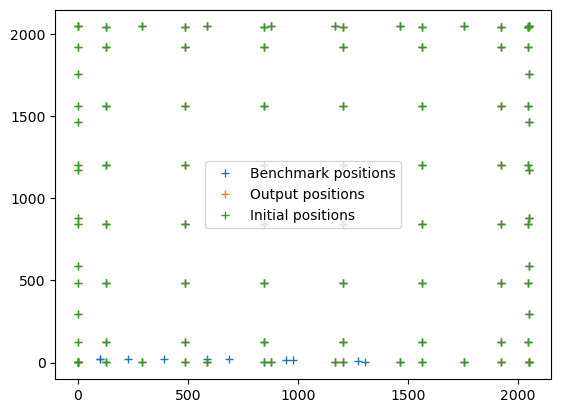

In [232]:
plt.plot(benchmark_pix_df.row,benchmark_pix_df.col,linestyle='None',marker='+',label='Benchmark positions')
plt.plot(output_pix_df.row, output_pix_df.col,linestyle='None',marker='+',label='Output positions')
plt.plot(footprint_df.row, footprint_df.col,linestyle='None',marker='+',label='Initial positions')

plt.legend()

# There was a large offset between some Benchmark (old tess_stars2px.py) and output (TESSPoint-vectorize), but overall on average good agreement.  

tess_stars2px.py, however, had some large excursions as well - are we doing better or worse?

# Overlplotting our initial testing footprint, it looks like we are much closer than our benchmark (e.g. all our output orange markers are covered by our input green markers, but there are a few benchmark points that are at high offset)

Lets check this in a more systematic manner!  Do a point-bypoint comparison with our Initial footprint pixel locations vs footprint pixel ->RA, DEC -> output pixel locations

In [226]:
def test_radec2pix_initial_SectorCameraCCD(SectorCameraCCD):
    Sector, Camera, CCD = SectorCameraCCD
    
    dir_testfiles='/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/testfiles'
    fprfile="/Users/tapritc2/tessgi/tesspoint/TESSPoint_CreateTestFiles/footprint_input.dat"    
    pixfile=dir_testfiles+"/TEST_radec2pix_Sec{:02d}_Cam{}_CCD{}_stars2px.dat".format(Sector,Camera,CCD)

    output_pix_df = test_radec2pix_SectorCameraCCD(SectorCameraCCD)
    init_pix_df=pd.read_csv(fprfile,delimiter=' ',names=['tic','row','col'],index_col=False)
    init_pix_df['index']=init_pix_df['tic']

    idx = output_pix_df.index.intersection(init_pix_df.index)
    
    dr = output_pix_df.loc[idx, 'row'] - init_pix_df.loc[idx, 'row']
    dc = output_pix_df.loc[idx, 'col'] - init_pix_df.loc[idx, 'col']
    
    return idx, dr, dc, Sector, Camera, CCD

### this is the same as the benchmark test, but comparing against our input footprint instead of our benchmark footprint
- that is, we are coparing (initial): footprint pixel location vs TESSPoint.radec2pix(tess_stars2pix.py --reverse footprint())
- not benchmark: tess_stars2px.py (tess_stars2px.py --reverse footprint()) vs TESSPoint.radec2pix(tess_stars2pix.py --reverse footprint())

In [227]:
from testfun import test_radec2pix_SectorCameraCCD, test_radec2pix_initial_SectorCameraCCD

test_radec2pix_init_df=pd.DataFrame(data=None, columns=['dr_med','dr_max','dr_std',
                                                   'dc_med','dc_max','dc_std',
                                                   'Sector','Camera','CCD'])
pool=Pool()

for result in pool.map(test_radec2pix_initial_SectorCameraCCD, inlist):
    r_med=np.median(result[1])
    r_max=max(result[1])
    r_std=np.std(result[1])
    
    dc_med=np.median(result[2])
    dc_max=max(result[2])
    dc_std=np.std(result[2])
    
    rdf=pd.DataFrame({'dr_med': r_med,'dr_max': r_max,'dr_std':r_std,
                       'dc_med': dc_med,'dc_max': dc_max,'dc_std':dc_std,
                     'Sector':result[3],'Camera':result[4],'CCD':result[5]},index=[0])
    
    test_radec2pix_init_df=pd.concat([rdf, test_radec2pix_init_df],ignore_index=True)
    
pool.close()

DEBUG:root:radec2pix: curVec: [[ 0.46422488 -0.48431262 -0.74157707]
 [ 0.47206223 -0.5031397  -0.72388376]
 [ 0.47982924 -0.52189993 -0.70525482]
 [ 0.48746659 -0.54050036 -0.68573733]
 [ 0.49491826 -0.55885165 -0.66538766]
 [ 0.50213387 -0.57686899 -0.64426993]
 [ 0.5090697  -0.59447242 -0.62245529]
 [ 0.51568896 -0.61158715 -0.60002171]
 [ 0.46422488 -0.48431262 -0.74157707]
 [ 0.48562849 -0.4683047  -0.7381434 ]
 [ 0.50717666 -0.45170169 -0.73398734]
 [ 0.52875681 -0.43454511 -0.72909998]
 [ 0.55025857 -0.41688235 -0.7234809 ]
 [ 0.57157666 -0.39876656 -0.71713691]
 [ 0.59261215 -0.38025667 -0.71008148]
 [ 0.61327282 -0.36141732 -0.70233465]
 [ 0.51568896 -0.61158715 -0.60002171]
 [ 0.53857278 -0.59630697 -0.59527922]
 [ 0.56149396 -0.58023598 -0.58995825]
 [ 0.58433429 -0.56341299 -0.58405415]
 [ 0.60698333 -0.54588155 -0.5775678 ]
 [ 0.62933654 -0.52769139 -0.57050619]
 [ 0.65129367 -0.50889996 -0.5628831 ]
 [ 0.67275852 -0.48957323 -0.55471977]
 [ 0.61327282 -0.36141732 -0.70233

 253.17669924 202.53707914 222.38348083 216IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

e+02  4.85400000e+02]
 [ 1.15820000e+03  4.85400000e+02]
 [ 1.51660000e+03  4.85400000e+02]
 [ 1.87500000e+03  4.85400000e+02]
 [ 8.30000000e+01  8.43800000e+02]
 [ 4.41400000e+02  8.43800000e+02]
 [ 7.99800000e+02  8.43800000e+02]
 [ 1.15820000e+03  8.43800000e+02]
 [ 1.51660000e+03  8.43800000e+02]
 [ 1.87500000e+03  8.43800000e+02]
 [ 8.30000000e+01  1.20220000e+03]
 [ 4.41400000e+02  1.20220000e+03]
 [ 7.99800000e+02  1.20220000e+03]
 [ 1.15820000e+03  1.20220000e+03]
 [ 1.51660000e+03  1.20220000e+03]
 [ 1.87500000e+03  1.202DEBUG:root:radec2pix: curVec: [[0.19728853 0.32897772 0.92349927]
 [0.19939685 0.30341022 0.9

 [32IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

29 32.29326616 27.90939691
 23.52648174 19.14517593 14.76691204 10.39553425  6.04599739  1.87684519
 31.76930229 27.38910685 23.01128618 18.63751379 14.2715122   9.92354331
  5.63550123  1.87684519 43.93110404 40.47519439 37.47457234 35.04637691
 33.3160059  32.39547369 43.90748877 40.37685013 37.28961296 34.76410785
 32.92983309 31.90622779 30.38230115 25.01013154 19.64005824 14.27444739
  8.9213542   3.63648527 29.86008841 24.49335294 19.13182032 13.78156419
  8.46399587  3.33911555 45.24048285 45.24048285  1.89760875  1.89760875
 42.55711672 38.90412112 35.68971629 33.042152   31.10650288 30.02079255
 38.97957981 34.95468636 31.33776168 28.28574318 25.99834

 [-0.08545073  0.19596793  0.97688011]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [228]:
test_radec2pix_init_df

,dr_med,dr_max,dr_std,dc_med,dc_max,dc_std,Sector,Camera,CCD
0,-1.151950e-09,3.738639e-07,1.458711e-07,6.862251e-09,2.862996e-07,1.469928e-07,68,4,4
1,1.118940e-08,3.258222e-07,1.358661e-07,9.415084e-09,4.129975e-07,1.376383e-07,68,4,3
2,1.131710e-09,4.120909e-07,1.479925e-07,-1.138346e-09,2.606913e-07,1.234570e-07,68,4,2
3,4.051003e-09,2.897017e-07,1.331953e-07,1.668923e-09,3.258810e-07,1.361026e-07,68,4,1
4,-1.181736e-09,4.165092e-07,1.460275e-07,9.525479e-09,3.626203e-07,1.504128e-07,68,3,4
...,...,...,...,...,...,...,...,...,...
1083,-1.452295e-08,3.431742e-07,1.539164e-07,-9.233759e-09,3.523353e-07,1.356204e-07,1,2,1
1084,6.556355e-10,3.460964e-07,1.286608e-07,-1.625949e-09,3.927616e-07,1.466806e-07,1,1,4
1085,-9.510586e-09,3.067173e-07,1.535972e-07,-6.079631e-09,2.679155e-07,1.367610e-07,1,1,3
1086,-1.362068e-09,4.192004e-07,1.472948e-07,4.812478e-09,3.694079e-07,1.503606e-07,1,1,2


In [230]:
print(max(test_radec2pix_init_df.dc_max))
print(max(test_radec2pix_init_df.dc_max))

4.1300643260910874e-07
4.1300643260910874e-07


## OK, So I think this means that we're doing better than benchmark TESSPoint at returning to our starting point!

# And that the big offsets in some of tess_stars2px.py were caused in the secord, regular run (e.g. ra, dec -> pix NOT the pix->ra, dec reverse mode)
since if we take the ra, dec output from tess_stars2px.py -- reverse and use TESSPoint.radec2pix we get the right intial footprint, those RA,DECs must be... good?

# This seems strange, I would have excpected the reverse portion to be less accurate?

# Can we verify this somehow?

we could still do a TESSPoint.radec2pix(TESSPoint(pix2radec(footprint())))

# This also means that we need to work on our pix2radec to get better agreement